In [17]:
import pandas as pd
import numpy as np
import os, gc, re
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from collections import defaultdict, Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from matplotlib.font_manager import FontManager, FontProperties
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.svm import SVC
from matplotlib.font_manager import FontManager, FontProperties
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import CountVectorizer
import emoji, requests
import subprocess
import tempfile, json
import seaborn as sns
import matplotlib.pyplot as plt
# # For English stopwords
# from nltk.corpus import stopwords
from tensorflow.keras.preprocessing.text import Tokenizer
import plotly.express as px
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Bidirectional, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
os.chdir("C:\\Users\\Peter_PPT\\OneDrive\\Courses\\MMDT Deep Learning_ ML\\project\\")

# Data collection

In [122]:
datapath = os.path.join(os.getcwd(),'data')
figpath = os.path.join(os.getcwd(),'fig')
files = ['ltrain.txt','ltest.txt','strain.txt','stest.txt']
gc.enable()

In [68]:
ldf = pd.DataFrame()
sdf = pd.DataFrame()
for file in files:
    if 'ltrain' in file or 'ltest' in file:
        ftype = 'long'
        print(f'processing long file: {file}')
    else:
        ftype = 'short'
        print(f'processing short file: {file}')
    with open(os.path.join(datapath,file), 'r') as f:
        file_content = f.readlines()
    for i, line in enumerate(file_content):
        file_content[i] = line.strip()
    labellist = []
    textlist = []
    for content in file_content:
        label = content.split("__label__")[1].split(" ")[0]
        text = " ".join(content.split("__label__")[1].split(" ")[1:])
        labellist.append(label)
        textlist.append(text)
    df = pd.DataFrame()
    df['text'] = textlist
    df['label'] = labellist
    if ftype=='long':
        print("concat to long")
        ldf = pd.concat([ldf,df])
    else: 
        print("concat to short")
        sdf = pd.concat([sdf,df])
print(f"all short file: {sdf.shape}: \t {sdf.head(3)}")
print(f"all long file: {ldf.shape}: \t {ldf.head(3)}")
ldf = ldf.reset_index(drop=True)
sdf = sdf.reset_index(drop=True)
ldf.to_csv(os.path.join(datapath,'longtext_org.csv'),index=False)
sdf.to_csv(os.path.join(datapath,'shorttext_org.csv'),index=False)
del labellist, textlist, df
gc.collect()

processing long file: ltrain.txt
concat to long
processing long file: ltest.txt
concat to long
processing short file: strain.txt
concat to short
processing short file: stest.txt
concat to short
all short file: (10137, 2): 	                  text label
0  လီး တောင် မ လီး ပဲ    ab
1  လောက် ဆောက်ရှက်ခွဲ    ab
2             သေခါနီး    ab
all long file: (10137, 2): 	                                                 text label
0       လီး တောင် ရိုးရိုး မ ဟုတ် ဘူး တပတ်လည် လီး ပဲ    ab
1  ဆူ စရာ ရှိ လည်း ကွယ်ရာ မှာ ပြော ပါ လား ကွာ စိတ...    ab
2                     သေခါနီး ရိက္ခာ ယူ နေ ကြ တယ် GL    ab


9455


The following rows are duplicates and their indices will be dropped:
Indices to be dropped: [5327, 6851, 8592, 8965, 9007, 9904, 9947]

Content of the duplicate rows to be dropped:
                                                                text label
5327                                                         ဖေလိုးမ    ab
6851                                       အဲ့ တာ လီး လုပ် ရ မှာ လား    ab
8592                                                စောက်ပေါ လင်မယား    ab
8965                                                မင်းမေလိုး လိုက်    ab
9007                                         လီးရုပ် က လီးရုပ် ပါ ပဲ    bo
9904  နင် တို့ လည်း နော် ကြီးကောင်ကြီးမား တွေ နဲ့ တော်ရုံပဲရူး ကြ ပါ    ab
9947                                                          အောလီမ    ab

Number of duplicate rows dropped: 7
Final number of rows before dropping duplicates in longtxt: 10137
Final number of rows before dropping duplicates in shorttxt: 10137
Final number of rows after dropping duplicates i

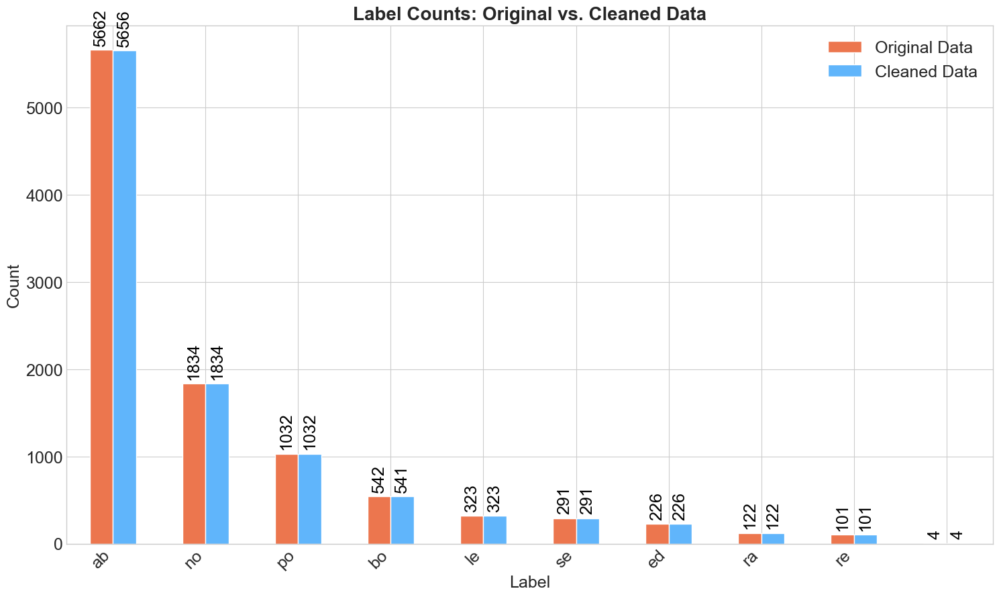

The comparison bar chart with rotated counts has been saved as 'original_vs_cleaned_distribution_rotated.png'


In [69]:
## Handling duplicated row
initial_rows = len(ldf)
## get the index to be dropped
dropped_indices = ldf[ldf.duplicated()].index.tolist()

if dropped_indices:
    print("\nThe following rows are duplicates and their indices will be dropped:")
    print(f"Indices to be dropped: {dropped_indices}")
    # Display the full rows that are marked as duplicates
    duplicate_rows_to_drop = ldf.loc[dropped_indices].to_string()
    print("\nContent of the duplicate rows to be dropped:")
    print(duplicate_rows_to_drop)
else:
    print("\nNo duplicate rows found.")

# Drop the duplicate rows, keeping the first occurrence
ldf_cleaned = ldf.drop_duplicates(keep='first').reset_index(drop=True)
sdf_cleaned = sdf.drop(dropped_indices).reset_index(drop=True)
# Print the number of rows dropped
rows_dropped = initial_rows - len(ldf_cleaned)
print(f"\nNumber of duplicate rows dropped: {rows_dropped}")
print(f"Final number of rows before dropping duplicates in longtxt: {len(ldf)}")
print(f"Final number of rows before dropping duplicates in shorttxt: {len(sdf)}")
print(f"Final number of rows after dropping duplicates in longtxt: {len(ldf_cleaned)}")
print(f"Final number of rows after dropping duplicates in shorttxt: {len(sdf_cleaned)}")
print("-" * 30)
print(ldf_cleaned)
print("---")
print(sdf_cleaned)
sdf_cleaned.to_csv(os.path.join(datapath,'shorttext_clean.csv'),index=False)
ldf_cleaned.to_csv(os.path.join(datapath,'longtext_clean.csv'),index=False)

## visualize

# --- Prepare data for plotting ---
# Get the value counts for the 'label' column from both dataframes
label_counts_initial = ldf['label'].value_counts()
label_counts_cleaned = ldf_cleaned['label'].value_counts()

# Combine the two series into a single DataFrame for easy plotting
# This ensures that the labels are correctly aligned for both datasets
comparison_df = pd.DataFrame({
    'Original Data': label_counts_initial,
    'Cleaned Data': label_counts_cleaned
}).fillna(0).astype(int) # Fill NaNs with 0 in case a label was removed entirely

# --- Visualize the data with specified font sizes and rotated counts ---
# Plot a single bar chart comparing the two dataframes
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(15, 9)) # Set figure size to 12, 8

# Plot the bars for both 'Original' and 'Cleaned' data
bars = comparison_df.plot(
    kind='bar',
    ax=ax,
    color=["#EC764E", "#60B5FB"],
    rot=45,
    fontsize=18 # Set x-tick label font size
)

# Set the title and labels with specified font sizes
ax.set_title('Label Counts: Original vs. Cleaned Data', fontsize=20, weight='bold')
ax.set_xlabel('Label', fontsize=18)
ax.set_ylabel('Count', fontsize=18)
ax.tick_params(axis='y', labelsize=18) # Set y-tick label font size
ax.set_xticklabels(ax.get_xticklabels(), ha='right', fontsize=18)

# Add the count value on top of each bar, rotated by 90 degrees
for bar in ax.patches:
    ax.text(
        bar.get_x() + bar.get_width() / 2, # x-position of the text
        bar.get_height() + 50, # y-position (slightly above the bar)
        int(bar.get_height()), # The text to display (the count value)
        ha='center', # Horizontal alignment
        va='bottom', # Vertical alignment
        fontsize=18, # Set the text label font size
        color='black',
        rotation=90 # Rotate the text by 90 degrees
    )

# Adjust layout and save the figure
plt.tight_layout()
plt.legend(fontsize=18)
plt.savefig(os.path.join(figpath,'original_vs_cleaned_distribution_rotated.png'))
plt.show()

print("The comparison bar chart with rotated counts has been saved as 'original_vs_cleaned_distribution_rotated.png'")


In [70]:

# Get the top 3 most frequent labels
label_counts = ldf_cleaned['label'].value_counts()
top_3_labels = label_counts.nlargest(3).index.tolist()
print(top_3_labels)
# Filter the DataFrame to keep only the top 3 classes
ldf_clean_top3 = ldf_cleaned[ldf_cleaned['label'].isin(top_3_labels)].copy()
sdf_clean_top3 = sdf_cleaned[sdf_cleaned['label'].isin(top_3_labels)].copy()
ldf_clean_top3 = ldf_clean_top3.reset_index(drop=True)
sdf_clean_top3 = sdf_clean_top3.reset_index(drop=True)
# Save the top 3 data to a new CSV file
print(ldf_clean_top3)
print("-----")
print(sdf_clean_top3)
ldf_clean_top3.to_csv(os.path.join(datapath,'longtext_cleaned_top3.csv'), index=False)
sdf_clean_top3.to_csv(os.path.join(datapath,'shorttext_cleaned_top3.csv'), index=False)
print("\nDataFrame with top 3 classes saved to 'longtext_cleaned_top3.csv'")
print("Top 3 classes distribution:")
print(ldf_clean_top3['label'].value_counts())


['ab', 'no', 'po']
                                                   text label
0          လီး တောင် ရိုးရိုး မ ဟုတ် ဘူး တပတ်လည် လီး ပဲ    ab
1     ဆူ စရာ ရှိ လည်း ကွယ်ရာ မှာ ပြော ပါ လား ကွာ စိတ...    ab
2                        သေခါနီး ရိက္ခာ ယူ နေ ကြ တယ် GL    ab
3     အောက်တန်းစား စိတ်ဓာတ် တွေ ဖာဆန် တဲ့ လုပ်ရပ် နဲ...    ab
4     စာအုပ် အဟောင်း သတင်းစာ အဟောင်း ပဲ ကျန် တော့ မှ...    no
...                                                 ...   ...
8517                   မိမွေးတိုင်းဖမွေးတိုင်းလေး 😁 😁 😁    ab
8518         သောက်တလွဲ ဘာ ethics မှ မ ရှိ တဲ့ ကောင် တွေ    ab
8519                       အဆဲ ခံ ဖို့ သက်သက် xင်ယား တာ    ab
8520  8 နာရီ ကျော် နေ ပြီ လေ ပြန် လာ လား ? Kmkl များ...    ab
8521  မ နိုင် တာ သိ လို့ ဘုရင် စနစ် နဲ့ ကိုင် ပြီး ခ...    no

[8522 rows x 2 columns]
-----
                                                   text label
0                                    လီး တောင် မ လီး ပဲ    ab
1                                    လောက် ဆောက်ရှက်ခွဲ    ab
2                   

Index(['original_index', 'text_long', 'label_long', 'text_short',
       'label_short'],
      dtype='object')
      original_index                                          text_long  \
0                  0       လီး တောင် ရိုးရိုး မ ဟုတ် ဘူး တပတ်လည် လီး ပဲ   
1                  1  ဆူ စရာ ရှိ လည်း ကွယ်ရာ မှာ ပြော ပါ လား ကွာ စိတ...   
2                  2                     သေခါနီး ရိက္ခာ ယူ နေ ကြ တယ် GL   
3                  3  အောက်တန်းစား စိတ်ဓာတ် တွေ ဖာဆန် တဲ့ လုပ်ရပ် နဲ...   
4                  4  စာအုပ် အဟောင်း သတင်းစာ အဟောင်း ပဲ ကျန် တော့ မှ...   
...              ...                                                ...   
8517            8517                   မိမွေးတိုင်းဖမွေးတိုင်းလေး 😁 😁 😁   
8518            8518         သောက်တလွဲ ဘာ ethics မှ မ ရှိ တဲ့ ကောင် တွေ   
8519            8519                       အဆဲ ခံ ဖို့ သက်သက် xင်ယား တာ   
8520            8520  8 နာရီ ကျော် နေ ပြီ လေ ပြန် လာ လား ? Kmkl များ...   
8521            8521  မ နိုင် တာ သိ လို့ ဘုရင် စနစ် နဲ့ ကိုင် ပြ

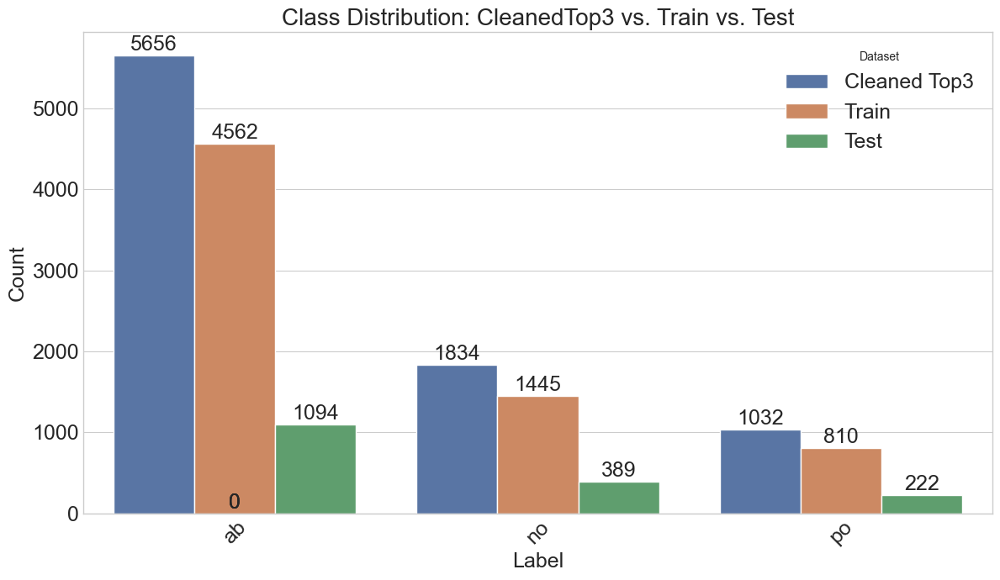

In [71]:
## split the training and test
combined_top3df = pd.DataFrame()
top3_ldf = ldf_clean_top3.copy()
top3_ldf['original_index']= top3_ldf.index
top3_ldf = top3_ldf.set_index('original_index').add_suffix('_long').reset_index()

top3_sdf = sdf_clean_top3.copy()
top3_sdf['original_index']= top3_sdf.index
top3_sdf = top3_sdf.set_index('original_index').add_suffix('_short').reset_index()

combined_top3df = pd.merge(top3_ldf, top3_sdf, on='original_index', how='left')

# combined_top3df = pd.merge(top3_ldf[['original_index']], top3_sdf, on='original_index', how='left')
print(combined_top3df.columns)
print(combined_top3df)

### split to train and text

X = combined_top3df[['text_long', 'text_short']]
y = combined_top3df[['label_long', 'label_short']]

# --- Step 3: Perform the 80/20 train-test split ---
# We use the train_test_split function from scikit-learn.
# - test_size=0.2 specifies that 20% of the data should be for testing.
# - random_state=42 ensures the split is the same every time you run the code.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
### save the test file
ltest = pd.DataFrame()
ltest['text']=X_test['text_long']
ltest['label']=y_test['label_long']
ltest= ltest.reset_index(drop=True)
stest = pd.DataFrame()
stest['text']=X_test['text_short']
stest['label']=y_test['label_short']
stest = stest.reset_index(drop=True)
ltest.to_csv(os.path.join(datapath,'longtext_test.csv'),index=False)
stest.to_csv(os.path.join(datapath,'shorttext_test.csv'),index=False)

### training file
ltrain = pd.DataFrame()
ltrain['text']=X_train['text_long']
ltrain['label']=y_train['label_long']
ltrain = ltrain.reset_index(drop=True)
strain = pd.DataFrame()
strain['text']=X_train['text_short']
strain['label']=y_train['label_short']
strain = strain.reset_index(drop=True)
print(ltrain.shape)
print(strain.shape)
print(ltrain)
print("-----")
print(strain)
### visualize the train test data

# --- Step 3: Calculate class counts for each dataset ---
original_counts = ldf_clean_top3['label'].value_counts().rename('Cleaned Top3').sort_index()
train_counts = ltrain['label'].value_counts().rename('Train').sort_index()
test_counts = ltest['label'].value_counts().rename('Test').sort_index()

# Combine the counts into a single DataFrame for plotting
counts_df = pd.concat([original_counts, train_counts, test_counts], axis=1).fillna(0)

print("Combined Class Counts for Visualization:")
print(counts_df)
print("-" * 40)

# --- Step 4: Visualize the data ---
# We'll use a grouped bar chart to compare the class distributions.
sns.set_style("whitegrid")
plt.figure(figsize=(12, 7))

# The fix is here: 'label' is now the column to melt on, not 'index'.
plot_df = counts_df.reset_index().melt('label', var_name='Dataset', value_name='Count')

barplot = sns.barplot(x='label', y='Count', hue='Dataset', data=plot_df, palette='deep')

# Add the count values on top of each bar
for p in barplot.patches:
    barplot.annotate(f'{int(p.get_height())}',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center',
                     xytext=(0, 9),
                     textcoords='offset points',
                     fontsize=18)

plt.title('Class Distribution: CleanedTop3 vs. Train vs. Test',fontsize=20)
plt.xlabel('Label',fontsize=18)
plt.ylabel('Count',fontsize=18)
plt.xticks(rotation=45,fontsize=18)
plt.yticks(fontsize=18)
plt.legend(title='Dataset',fontsize=18)
plt.tight_layout()
plt.savefig(os.path.join(figpath,'Cleantop3_train_test_distribution.png'))
plt.show()


In [72]:
print(counts_df)

       Cleaned Top3  Train  Test
label                           
ab             5656   4562  1094
no             1834   1445   389
po             1032    810   222


                                                   text label  original_index
0             ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး 😔    ab            5979
1     ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပ...    po            3296
2     ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း ...    ab            3261
3     တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ်စစ...    po            4725
4                                  ၀က်ရူးပြန် နေ တာ လား    no            2093
...                                                 ...   ...             ...
5995  အရမ်း ကို လူမဆန် တာ ဒါ ဘာသာ ရေး အမည်ခံ ပြီး စီ...    po             418
5996  နင် တို့ ဘာ ဖြစ် နေ ကြ တာ လဲ ဟင် မ သိ လို့ နော...    no            3399
5997                  နင် လား ငါ လား ပဲ နော် မြန်မာ နဲ့    no            5532
5998  ဒီ လောက် ကျက်သရေ ရှိ တဲ့ post က ဘာ တွေ များ ရု...    no            5981
5999  အရင် တည်းက လှ လို့ သဘောကျ ပေမဲ့ စောက်ကြောတင်း ...    ab            3858

[6000 rows x 3 columns]
The bar chart has been saved as 'class_

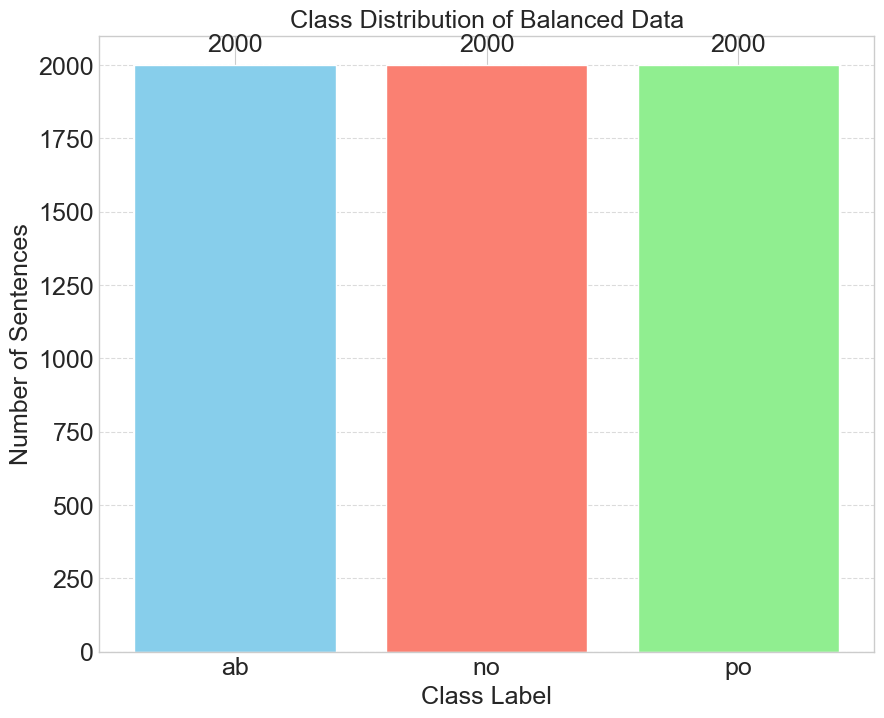

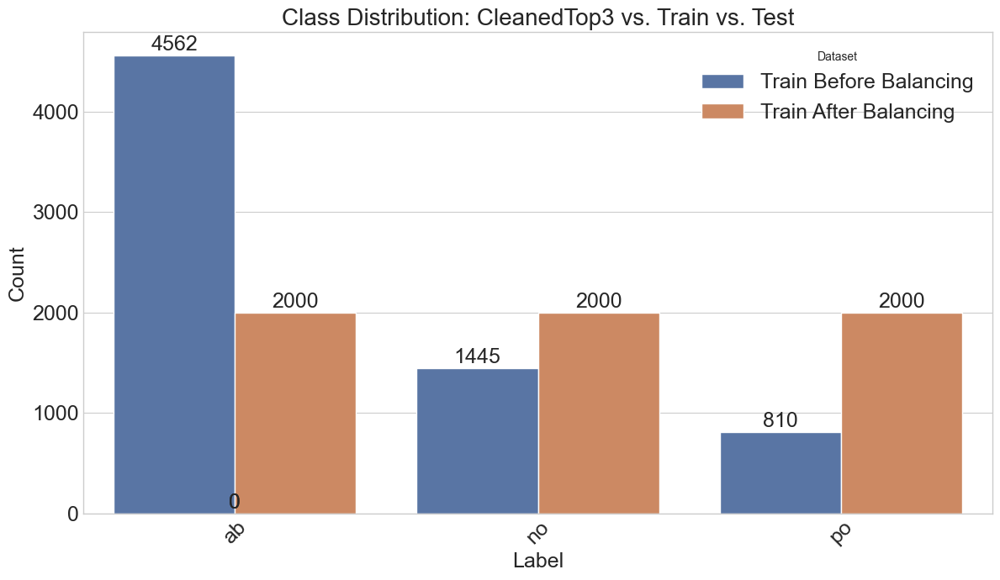

In [73]:
### Make balance data
filtered_ldf = ltrain.copy()
filtered_sdf = strain.copy()
filtered_ldf['original_index']=filtered_ldf.index
filtered_sdf['original_index']=filtered_sdf.index
# Define the target number of samples for each class
target_count = 2000

# Initialize an empty list to store the resampled longtext dataframes
resampled_ldf_list = []

# Perform bootstrapping on the longtext data to balance the classes
for label in ['ab', 'po', 'no']:
    class_df = filtered_ldf[filtered_ldf['label'] == label]
    # Use the sample method with `replace=True` for bootstrapping
    resampled_class_df = class_df.sample(n=target_count, replace=True, random_state=42)
    resampled_ldf_list.append(resampled_class_df)

# Concatenate all the resampled longtext dataframes to create the balanced longtext dataframe
balanced_ldf = pd.concat(resampled_ldf_list)

# Shuffle the balanced longtext dataframe to mix the classes
balanced_ldf = balanced_ldf.sample(frac=1, random_state=42).reset_index(drop=True)
print(balanced_ldf)
# Use the 'original_index' from the balanced longtext dataframe to get the corresponding shorttext rows
balanced_sdf = pd.merge(balanced_ldf[['original_index']], filtered_sdf, on='original_index', how='left')

# The final dataframes 'balanced_ldf' and 'balanced_sdf' now have 2000 rows each for
# 'ab', 'po', and 'no' classes, with their rows perfectly matched.

# You can save these to new CSV files if needed
balanced_ldf.to_csv(os.path.join(datapath,'balanced_longtext_train.csv'), index=False)
balanced_sdf.to_csv(os.path.join(datapath,'balanced_shorttext_train.csv'), index=False)


# --- Visualization section with increased font sizes ---
class_counts = balanced_ldf['label'].value_counts().sort_index()
labels = class_counts.index
counts = class_counts.values

plt.figure(figsize=(10, 8))
bars = plt.bar(labels, counts, color=['skyblue', 'salmon', 'lightgreen'])

# Add labels and title with larger font sizes
plt.title('Class Distribution of Balanced Data', fontsize=18)
plt.xlabel('Class Label', fontsize=18)
plt.ylabel('Number of Sentences', fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

# Add count value on top of each bar with a larger font size
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 30, yval, ha='center', va='bottom', fontsize=18)

# Save the plot to a file
plt.savefig(os.path.join(figpath,'balanced class_distribution.png'))

print("The bar chart has been saved as 'class_distribution_large_font.png'")

### visualize before and after

# --- Step 3: Calculate class counts for each dataset ---
before_counts = filtered_ldf['label'].value_counts().rename('Train Before Balancing').sort_index()
after_counts = balanced_ldf['label'].value_counts().rename('Train After Balancing').sort_index()

# Combine the counts into a single DataFrame for plotting
counts_df = pd.concat([before_counts, after_counts], axis=1).fillna(0)

print("Combined Class Counts for Visualization:")
print(counts_df)
print("-" * 40)

# --- Step 4: Visualize the data ---
# We'll use a grouped bar chart to compare the class distributions.
sns.set_style("whitegrid")
plt.figure(figsize=(12, 7))

# The fix is here: 'label' is now the column to melt on, not 'index'.
plot_df = counts_df.reset_index().melt('label', var_name='Dataset', value_name='Count')

barplot = sns.barplot(x='label', y='Count', hue='Dataset', data=plot_df, palette='deep')

# Add the count values on top of each bar
for p in barplot.patches:
    barplot.annotate(f'{int(p.get_height())}',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center',
                     xytext=(0, 9),
                     textcoords='offset points',
                     fontsize=18)

plt.title('Class Distribution: CleanedTop3 vs. Train vs. Test',fontsize=20)
plt.xlabel('Label',fontsize=18)
plt.ylabel('Count',fontsize=18)
plt.xticks(rotation=45,fontsize=18)
plt.yticks(fontsize=18)
plt.legend(title='Dataset',fontsize=18)
plt.tight_layout()
plt.savefig(os.path.join(figpath,'Train_before_after_balancing_distribution.png'))
plt.show()


# Analysis part

### Data Preprocessing and exploration

In [3]:

def handle_missing_values(df, text_column='text', label_column='label'):
    """
    Handle missing values in the dataset
    """
    # print(f"Original dataset shape: {df.shape}")
    
    # # Check for missing values
    # print("\nMissing values before handling:")
    # print(df.isnull().sum())
    
    # Drop rows with missing labels
    df = df.dropna(subset=[label_column])
    df = df.dropna(subset=[text_column])    
    # print("Missing values after handling:")
    # print(df.isnull().sum())
    
    return df



In [4]:
def preprocess_text(text,myanmar_stopwords=None):
    ## convert emoji to text token
    text = emoji.demojize(text, delimiters=("", ""))
    # print(f'convert emoji: {text}')
    ## Remove unwanted characters (keep Myanmar, English, and emoji tokens)
    text = re.sub(r'[^a-zA-Z\u1000-\u109F\s:]', '', text)
    # Remove user mentions (@username)
    text = re.sub(r'@\w+', '', text)
    # Remove hashtag symbol but keep the text content
    text = re.sub(r'#(\w+)', r'\1', text)  # Remove # but keep the word
    # Remove all numbers (digits)
    # text = re.sub(r'\d+', '', text)
    # print(f'remove unwanted characters: {text}')
    ## Tokenize
    tokens = text.split()
    if myanmar_stopwords:
        print('has stopwords')
        ## Remove stopwords if provided
        tokens = [token for token in tokens if token not in myanmar_stopwords]
    # print(f'tokenize: {tokens}')
    return ' '.join(tokens)
stop_words=["ပါ", "က", "ကို", "တယ်", "မ", "နေ", "တာ", "သည်", "မှာ", "တွေ", "ရ", "တော့", "ဖြစ်", "တဲ့", "များ", 
    "ပြီး", "လည်း", "နဲ့", "လို့", "တို့", "ရှိ", "ဆို", "ပဲ", "သူ", "ခဲ့", "ဘူး", "တစ်", "လိုက်", "မှ", "ကြ", 
    "လာ", "သွား", "ပြော", "ပေး", "၏", "လား", "ရင်", "နိုင်", "ထား", "သော", "လေ", "မယ်", "လေး", "ပြီ", "ချင်", 
    "လုပ်", "တွင်", "ချစ်", "လဲ", "နှင့်", "ဟုတ်", "သိ", "ရဲ့", "နော်", "ဘာ", "ရေး", "ဒီ", "ကောင်း", "မှု", 
    "လို", "အရမ်း", "ဟာ", "အားပေး", "ပြန်", "နှစ်", "ပါစေ", "ကြီး", "ကျွန်တော်", "ခု", "ဖို့", "ထဲ", "အတွက်", 
    "ပေါ့", "၍", "ခြင်း", "သူ့", "ကြည့်", "လူ", "အောင်", "ယောက်", "သာ", "သေး", 
    "သို့", "ကလေး", "ဦး", "ရောက်", "ရေ", "တတ်", "စရာ", "ရယ်", "လှ", "ဘယ်", "ရာ", "ဟု", "ကြိုက်", "မည်", 
    "တွေ့","ရှင့်", "ဗျ", "ဗျာ","ရှ င့်" , "ရှင်","ရှ င်",'မ','မည်','သည်','ဟု','ကို','၏','အတွက်','အပေါ်','အနေဖြင့်','နှင့်','သို့','မှ','ပါ','လည်း','တစ်ခုတည်းသော','တစ်ခုတည်း', 'အချို့', 'အချို့သော', 'အခြား', 'အခြားသော', 'အများ', 'အများသော', 'အများကြီး', 'အများစု', 'အများစုသော', 'အနည်းငယ်', 'အနည်းငယ်သော', 'အနည်းငယ်ကြီး', 'အနည်းငယ်စု','။']

In [5]:
trainfilename = 'balanced_shorttext_train.csv'
trainfilename = 'balanced_longtext_train.csv'
testfilename = 'longtext_test.csv'
datapath = os.path.join(os.getcwd(),'data')
figpath = os.path.join(os.getcwd(),'fig')

try:
    train_df = pd.read_csv(os.path.join(datapath,trainfilename))
    test_df = pd.read_csv(os.path.join(datapath,testfilename))
except FileNotFoundError as e:
    print(f"Error: {e}. Please make sure the files are in the correct directory.")
print(f"Initial train shape: {train_df.shape}")
train_df = handle_missing_values(train_df, text_column='text', label_column='label')
print(f'After handling missing values train shape: {train_df.shape}')
print("-----")
print(f'Initial test shape: {test_df.shape}')
test_df = handle_missing_values(test_df, text_column='text', label_column='label')
print(f'After handling missing values test shape: {test_df.shape}')
train_texts = train_df['text'].tolist()
test_texts = test_df['text'].tolist()
train_labels = train_df['label'].tolist()
test_labels = test_df['label'].tolist()

# train_texts = train_df.loc[:4,'text'].tolist()
# test_texts = test_df.loc[:4,'text'].tolist()
# train_labels = train_df.loc[:4,'label'].tolist()
# test_labels = test_df.loc[:4,'label'].tolist()
# train_df_copy = train_df.copy()
# test_df_copy = test_df.copy()
# train_df= train_df[:5]
# test_df = test_df[:5]

## Label encoder
le = LabelEncoder()
train_df['label_encoded'] = le.fit_transform(train_df['label'])
test_df['label_encoded'] = le.transform(test_df['label'])


Initial train shape: (6000, 3)
After handling missing values train shape: (6000, 3)
-----
Initial test shape: (1705, 2)
After handling missing values test shape: (1705, 2)


In [5]:
display(train_df.head(6))

,text,label,original_index,label_encoded
0,ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး 😔,ab,5979,0
1,ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပ...,po,3296,2
2,ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း ...,ab,3261,0
3,တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ်စစ...,po,4725,2
4,၀က်ရူးပြန် နေ တာ လား,no,2093,1
5,ဖင်ခံ လို့ မ ဝ သေး လို့ ဘောပါမ ချင် တာ လား,ab,6583,0


In [ ]:
## this part no need
'''
# Step 1: Write the text column to a temporary input file
with tempfile.NamedTemporaryFile('w+', encoding='utf-8', delete=False) as tmp_in:
    train_df['text'].to_csv(tmp_in, index=False, header=False)
    tmp_in_path = tmp_in.name

# Step 2: Prepare a temporary output file
with tempfile.NamedTemporaryFile('r', encoding='utf-8', delete=False) as tmp_out:
    tmp_out_path = tmp_out.name

myword_dir = os.path.join(os.getcwd(), 'myWord')
dict_dir = os.path.join(myword_dir, 'dict_ver1')
myword_py = os.path.join(myword_dir, 'myword.py')
unigram_bin = os.path.join(dict_dir, 'unigram-word.bin')
bigram_bin = os.path.join(dict_dir, 'bigram-word.bin')

try:

    result=subprocess.run([
        'python', myword_py, 'word',
        '-ub', unigram_bin,
        '-bb', bigram_bin,
        tmp_in_path, tmp_out_path
    ], check=True)
    print(result.stdout)
    print(result.stderr)
except subprocess.CalledProcessError as e:
    print("STDOUT:", e.stdout)
    print("STDERR:", e.stderr)
    raise
train_df_proc = train_df.copy()
with open(tmp_out_path, encoding='utf-8') as f:
    segmented_lines = [line.strip() for line in f.readlines()]
    train_df_proc['text'] = segmented_lines

# Step 5: Save to a new CSV (or overwrite if you want)
train_df_proc.to_csv('trainfilename_segmented.csv', index=False)
print("Segmented text column saved to 'trainfilename_segmented.csv'")
# os.remove(tmp_in_path)
# os.remove(tmp_out_path)
'''

None
None


In [ ]:
# sents = train_df.loc[:5,'text'].tolist()
# print(sents)
# sents_text =[preprocess_text(sent) for sent in sents]
# print(sents_text)

['ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး 😔', 'ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပဲ လေ ၊ ဆရာဝန် ကောင်း ဖြစ် ဖို့ က တော့ လုံးဝ ( လုံးဝ ) မ ဖြစ် နိုင် ပါ ဘူး ဒီမင်းဒီစိုးဒီသူခိုး နဲ့ ၊ ဒီ မိုး ဒီ မြေ ဒီ လူ တွေ နဲ့ ၊ ဒီ မျိုးစေ့ က ဒီ အပင် ပဲ ပေါက် မှာ ပါ ။ 👍', 'ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း မှ ပဲ', 'တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ်စစ် မ ရ ချင် ကြ တာ ပါ မြန်မာ သာ ဖယ်ထရယ် ဒီမိုကရေစီ စစ်စစ် ကျင့်သုံး ရင် တရုတ် မှာ လည်း လှုပ် လာ မှာ ပဲ တရုတ် လည်း မြန်မာ လို ပြည်နယ် များ စွာ ကို ချုပ်ကိုင် ပြီး အုပ်ချုပ် နေ တာ', '၀က်ရူးပြန် နေ တာ လား', 'ဖင်ခံ လို့ မ ဝ သေး လို့ ဘောပါမ ချင် တာ လား']
['ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး pensiveface', 'ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပဲ လေ ၊ ဆရာဝန် ကောင်း ဖြစ် ဖို့ က တော့ လုံးဝ လုံးဝ မ ဖြစ် နိုင် ပါ ဘူး ဒီမင်းဒီစိုးဒီသူခိုး နဲ့ ၊ ဒီ မိုး ဒီ မြေ ဒီ လူ တွေ နဲ့ ၊ ဒီ မျိုးစေ့ က ဒီ အပင် ပဲ ပေါက် မှာ ပါ ။ thumbsup', 'ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း မှ ပဲ', 'တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ

In [6]:
train_texts

['ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး 😔',
 'ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပဲ လေ ၊ ဆရာဝန် ကောင်း ဖြစ် ဖို့ က တော့ လုံးဝ ( လုံးဝ ) မ ဖြစ် နိုင် ပါ ဘူး ဒီမင်းဒီစိုးဒီသူခိုး နဲ့ ၊ ဒီ မိုး ဒီ မြေ ဒီ လူ တွေ နဲ့ ၊ ဒီ မျိုးစေ့ က ဒီ အပင် ပဲ ပေါက် မှာ ပါ ။ 👍',
 'ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း မှ ပဲ',
 'တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ်စစ် မ ရ ချင် ကြ တာ ပါ မြန်မာ သာ ဖယ်ထရယ် ဒီမိုကရေစီ စစ်စစ် ကျင့်သုံး ရင် တရုတ် မှာ လည်း လှုပ် လာ မှာ ပဲ တရုတ် လည်း မြန်မာ လို ပြည်နယ် များ စွာ ကို ချုပ်ကိုင် ပြီး အုပ်ချုပ် နေ တာ',
 '၀က်ရူးပြန် နေ တာ လား',
 'ဖင်ခံ လို့ မ ဝ သေး လို့ ဘောပါမ ချင် တာ လား',
 'ရူး နေ တာ လား မသာမ',
 'လူ့ ခန္ဓာကိုယ် နဲ့ တိရိစ္ဆာန်စိတ် ပေါက် သူ များ',
 'နိုင်ငံ မှာ ငြိမ်းချမ်း သွား ပြီ လား မအေloe မျိုး တွေ နဲ့ ဖအူထုပ်မ တွေ ရေ',
 'လီး ပဲ မသာမ ရေ စောက်မြင်တွေလည်းကပ် လာ ပြီ',
 'နောက် တစ် ယောက် ပေါ် လာ ပြန် ပြီ လား ပထမ တစ် ခါ တုန်း က တ\u200cစ် ယောက် လည်း အဲ့လို ပဲ လူ တွေ ပျောက် လို့ လိုက် ရှာ မှ အလိမ် ပေါ် တာ လေ အခု လည်း ထပ် ပြီး ပေါ် လာ ပြန် ပြီ',
 '

In [6]:

# --- PREPROCESSING STEP ---
train_texts = [preprocess_text(t,stop_words) for t in train_texts]
test_texts = [preprocess_text(t,stop_words) for t in test_texts]
train_df['cleaned_text'] = train_texts
test_df['cleaned_text'] = test_texts
display(train_df)


has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has stopwords
has st

,text,label,original_index,label_encoded,cleaned_text
0,ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး 😔,ab,5979,0,ဖာ မင်း လက်စ ညီမပေး pensiveface
1,ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပ...,po,3296,2,ဆရာဝန် မှတ် မှီ ဒါ ကျက် ဒါ ဖြေ ၊ ဆရာဝန် လုံးဝ ...
2,ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း ...,ab,3261,0,ဖက်တီး ဘို မှုတ် ငါ လီး တည်း
3,တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ်စစ...,po,4725,2,တရုတ် ဖျင်ခံ စစ်ခွေး ဒီမို စစ်စစ် မြန်မာ ဖယ်ထရ...
4,၀က်ရူးပြန် နေ တာ လား,no,2093,1,၀က်ရူးပြန်
...,...,...,...,...,...
5995,အရမ်း ကို လူမဆန် တာ ဒါ ဘာသာ ရေး အမည်ခံ ပြီး စီ...,po,418,2,လူမဆန် ဒါ ဘာသာ အမည်ခံ စီးပွား လုပ်စား ခွေး အာဏ...
5996,နင် တို့ ဘာ ဖြစ် နေ ကြ တာ လဲ ဟင် မ သိ လို့ နော...,no,3399,1,နင် ဟင် ငါ တော်ရုံ ဝင် လေ့
5997,နင် လား ငါ လား ပဲ နော် မြန်မာ နဲ့,no,5532,1,နင် ငါ မြန်မာ
5998,ဒီ လောက် ကျက်သရေ ရှိ တဲ့ post က ဘာ တွေ များ ရု...,no,5981,1,လောက် ကျက်သရေ post ရုပ်ပေါက် thinkingface


### Generate Features

In [7]:
for i in train_df.loc[:5,'cleaned_text'].tolist():
    print(i)

ဖာ မင်း လက်စ ညီမပေး pensiveface
ဆရာဝန် မှတ် မှီ ဒါ ကျက် ဒါ ဖြေ ၊ ဆရာဝန် လုံးဝ လုံးဝ ဒီမင်းဒီစိုးဒီသူခိုး ၊ မိုး မြေ ၊ မျိုးစေ့ အပင် ပေါက် thumbsup
ဖက်တီး ဘို မှုတ် ငါ လီး တည်း
တရုတ် ဖျင်ခံ စစ်ခွေး ဒီမို စစ်စစ် မြန်မာ ဖယ်ထရယ် ဒီမိုကရေစီ စစ်စစ် ကျင့်သုံး တရုတ် လှုပ် တရုတ် မြန်မာ ပြည်နယ် စွာ ချုပ်ကိုင် အုပ်ချုပ်
၀က်ရူးပြန်
ဖင်ခံ ဝ ဘောပါမ


In [8]:
vectorizer_cv= CountVectorizer(token_pattern=r'\S+',stop_words=stop_words)
X_cv = vectorizer_cv.fit_transform(train_df['cleaned_text'].tolist())
df_train_cv = pd.DataFrame(X_cv.toarray(), columns=vectorizer_cv.get_feature_names_out())

print(df_train_cv.columns)
display(df_train_cv)

Index([':', 'a', 'academy', 'acc', 'account', 'akရိုက်', 'angryface',
       'angryfaceangryfaceangryface',
       'angryfacewithhornsangryfacewithhornsangryfacewithhornsangryfacewithhorns',
       'anguishedface',
       ...
       '၇၁', '၇၅', '၈', '၈၀၀', '၈၈', '၈၈မျိုးယုတ်', '၉', '၉:၁၀', '၉၉၉၉', '၊'],
      dtype='object', length=5623)


c:\Users\Peter_PPT\anaconda3\envs\nlp_myanmar\lib\site-packages\sklearn\feature_extraction\text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['င်', 'င့်', 'ရှ'] not in stop_words.
  warnings.warn(


,:,a,academy,acc,account,akရိုက်,angryface,angryfaceangryfaceangryface,angryfacewithhornsangryfacewithhornsangryfacewithhornsangryfacewithhorns,anguishedface,...,၇၁,၇၅,၈,၈၀၀,၈၈,၈၈မျိုးယုတ်,၉,၉:၁၀,၉၉၉၉,၊
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
### TFIDF vectorization
vectorizer_tfidf = TfidfVectorizer(token_pattern=r'\S+',stop_words=stop_words)
X_train_tfidf = vectorizer_tfidf.fit_transform(train_df['cleaned_text'].tolist())
X_test_tfidf = vectorizer_tfidf.transform(test_df['cleaned_text'].tolist())
y_train_tfidf = train_df['label_encoded'].tolist()
y_test_tfidf = test_df['label_encoded'].tolist()

### to visualize the TF-IDF matrix
dense = X_train_tfidf.todense()
df_train_tfidf = pd.DataFrame(dense, columns=vectorizer_tfidf.get_feature_names_out())


# Select the specific words you want to visualize
selected_words = ['စစ်ခွေး', 'ဖျင်ခံ', 'ဖာ', '၀က်ရူးပြန်', 'ဖင်ခံ', 'ဘောပါမ', 'ရူး', 'မသာမ', 'လီး', 'စောက်မြင်တွေလည်းကပ်']

# Filter only the columns that actually exist in your DataFrame
available_words = [word for word in selected_words if word in df_train_tfidf.columns]

# Select first 11 rows (0 to 10 inclusive) and only available words
subset_data = df_train_tfidf.iloc[0:11][available_words]

# Create the heatmap
fig = px.imshow(
    subset_data.values,
    labels=dict(x="Word", y="Sentence", color="TF-IDF"),
    x=subset_data.columns.tolist(),
    y=subset_data.index.tolist(),
    color_continuous_scale="YlOrRd",
    aspect="auto",
    text_auto=".2f",  # This will automatically display values with 2 decimal places
    title="TF-IDF Values for Selected Words Across Sentences"
)

# Update layout
fig.update_layout(
    xaxis_title="Word",
    yaxis_title="Sentence Index",
    font=dict(family="Noto Sans Myanmar, Padauk, Arial Unicode MS, sans-serif", size=12),
    width=900,
    height=600
)

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=45)

fig.show()

# fig = px.imshow(
#     # df_train_tfidf.iloc[:10].values,
#     df_train_tfidf.loc[0:11, ['စစ်ခွေး','ဖျင်ခံ', 'ဖာ', '၀က်ရူးပြန်', 'ဖင်ခံ', 'ဘောပါမ', 'ရူး', 'မသာမ', 'လီး','စောက်မြင်တွေလည်းကပ်']],
#     labels=dict(x="Word", y="Sentence", color="TF-IDF"),
#     x=df_train_tfidf.columns,
#     y=df_train_tfidf.index[:10],
#     color_continuous_scale="YlOrRd",
#     text_auto=".2f"
# )
# fig.update_layout(
#     title="Color-Coded Heatmap of Data ",
#     xaxis_title="Word",
#     yaxis_title="Sentence",
#     font=dict(family="Noto Sans Myanmar, Padauk, Arial Unicode MS, sans-serif", size=16)
# )
# fig.show()

tfidfvoc = vectorizer_tfidf.vocabulary_
print(f'TFIDF voc: {tfidfvoc}')

c:\Users\Peter_PPT\anaconda3\envs\nlp_myanmar\lib\site-packages\sklearn\feature_extraction\text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['င်', 'င့်', 'ရှ'] not in stop_words.
  warnings.warn(


TFIDF voc: {'ဖာ': 2927, 'မင်း': 3293, 'လက်စ': 3935, 'ညီမပေး': 1954, 'pensiveface': 333, 'ဆရာဝန်': 1812, 'မှတ်': 3672, 'မှီ': 3692, 'ဒါ': 2312, 'ကျက်': 747, 'ဖြေ': 3070, '၊': 5622, 'လုံးဝ': 4087, 'ဒီမင်းဒီစိုးဒီသူခိုး': 2331, 'မိုး': 3465, 'မြေ': 3641, 'မျိုးစေ့': 3593, 'အပင်': 4990, 'ပေါက်': 2709, 'thumbsup': 501, 'ဖက်တီး': 2842, 'ဘို': 3191, 'မှုတ်': 3693, 'ငါ': 1286, 'လီး': 4053, 'တည်း': 2045, 'တရုတ်': 2091, 'ဖျင်ခံ': 3026, 'စစ်ခွေး': 1371, 'ဒီမို': 2332, 'စစ်စစ်': 1373, 'မြန်မာ': 3625, 'ဖယ်ထရယ်': 2913, 'ဒီမိုကရေစီ': 2333, 'ကျင့်သုံး': 771, 'လှုပ်': 4232, 'ပြည်နယ်': 2764, 'စွာ': 1769, 'ချုပ်ကိုင်': 1070, 'အုပ်ချုပ်': 5430, '၀က်ရူးပြန်': 5567, 'ဖင်ခံ': 2859, 'ဝ': 4238, 'ဘောပါမ': 3244, 'ရူး': 3829, 'မသာမ': 3395, 'လူ့': 4149, 'ခန္ဓာကိုယ်': 945, 'တိရိစ္ဆာန်စိတ်': 2113, 'နိုင်ငံ': 2462, 'ငြိမ်းချမ်း': 1331, 'မအေloe': 3410, 'မျိုး': 3588, 'ဖအူထုပ်မ': 2925, 'စောက်မြင်တွေလည်းကပ်': 1660, 'နောက်': 2499, 'ပေါ်': 2729, 'ပထမ': 2578, 'ခါ': 959, 'တုန်း': 2146, 'အဲ့လို': 5499, 'ပျောက်': 2743, 'ရှာ':

#### understanding part

In [9]:
### this is just understanding part
# Calculate the sum of TF-IDF scores for each word (column)
tfidf_sums = df_train_tfidf.sum(axis=0)
# Sort words by their total TF-IDF score (descending)
sorted_words = tfidf_sums.sort_values(ascending=False)
print("TF-IDF words sorted by importance:")
for word, score in sorted_words.items():
    print(f"{word}: {score:.4f}")

### find the word's tfidf score
# Index of the word "ဖာ"
word = "ဖာ"
index = tfidfvoc[word]
print(f"Index of '{word}':", index)

# Look at the TF-IDF scores for each document
# X is a sparse matrix -> convert to array
tfidf_matrix = X_train_tfidf.toarray()
print("TF-IDF Matrix:\n", tfidf_matrix)

# TF-IDF score of "ဖာ" in each document
scores = tfidf_matrix[:, index]
print(f"TF-IDF scores for '{word}':", scores)

TF-IDF words sorted by importance:
တာ: 322.1497
တွေ: 308.9841
က: 275.9561
နေ: 254.7043
တယ်: 211.2056
တဲ့: 184.4504
ပဲ: 183.2318
ဘူး: 176.1396
တော့: 174.1951
နဲ့: 173.0429
ရ: 167.6033
လို့: 161.4292
လား: 154.5446
မှာ: 144.6262
ပြော: 129.7879
တို့: 128.1673
သူ: 119.4832
ဆို: 117.8314
ကြ: 117.6811
လိုက်: 117.6398
ပြီး: 116.4206
ရှိ: 111.7520
လုပ်: 107.8158
ဘာ: 104.8184
တစ်: 102.5321
ရင်: 96.5631
ပေး: 96.3628
ဖြစ်: 93.4952
လာ: 90.2357
လဲ: 90.0742
ပြီ: 88.0518
သိ: 87.0893
ချင်: 84.5398
သွား: 84.0149
ကြီး: 79.8621
ဟုတ်: 76.8540
မယ်: 75.7172
မအလ: 75.4346
လို: 75.0642
နော်: 73.5634
ထား: 72.9325
facewithtearsofjoy: 72.6042
ဒီ: 71.1909
ကောင်း: 70.2128
လေ: 69.0246
တောင်: 67.5367
မင်း: 67.4522
နိုင်ငံ: 67.3291
ငါ: 67.2138
အဲ့: 66.7172
မြန်မာ: 66.2666
လေး: 65.3793
ကောင်: 65.3298
ပေါ့: 61.1530
လူ: 59.9270
ရဲ့: 59.6267
များ: 58.3155
ကြည့်: 58.1582
ပြည်သူ: 56.4511
beamingfacewithsmilingeyes: 55.8349
နင်: 51.1260
စရာ: 49.9069
အောင်: 49.6429
သေး: 49.5329
ဘောမ: 49.4275
ဘယ်: 48.1595
ထဲ: 47.6675
လောက်: 47.

In [10]:
display(df_train_tfidf)
display(tfidf_sums)

,:,a,academy,acc,account,akရိုက်,angryface,angryfaceangryfaceangryface,angryfacewithhornsangryfacewithhornsangryfacewithhornsangryfacewithhorns,anguishedface,...,၇၅,၈,၈၀၀,၈၈,၈၈မျိုးယုတ်,၉,၉:၁၀,၉၉၉၉,၊,၍
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.35849,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0


:           5.485273
a           1.523796
academy     0.924471
acc         1.190497
account     1.486340
             ...    
၉           1.926278
၉:၁၀        0.351431
၉၉၉၉        0.224209
၊          25.400523
၍           4.534090
Length: 5713, dtype: float64

## Train ML model


Logistic Regression Training Classification Report:
              precision    recall  f1-score   support

          ab       0.95      0.93      0.94      2000
          no       0.94      0.95      0.94      2000
          po       0.96      0.97      0.97      2000

    accuracy                           0.95      6000
   macro avg       0.95      0.95      0.95      6000
weighted avg       0.95      0.95      0.95      6000


Logistic Regression Test Classification Report:
              precision    recall  f1-score   support

          ab       0.87      0.72      0.79      1094
          no       0.58      0.72      0.64       389
          po       0.50      0.70      0.58       222

    accuracy                           0.72      1705
   macro avg       0.65      0.72      0.67      1705
weighted avg       0.76      0.72      0.73      1705



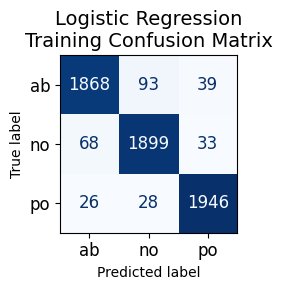

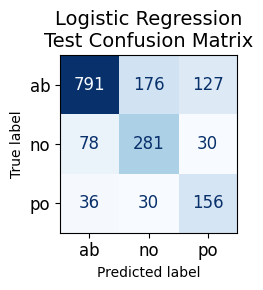


Naive Bayes Training Classification Report:
              precision    recall  f1-score   support

          ab       0.95      0.88      0.91      2000
          no       0.92      0.92      0.92      2000
          po       0.90      0.97      0.93      2000

    accuracy                           0.92      6000
   macro avg       0.92      0.92      0.92      6000
weighted avg       0.92      0.92      0.92      6000


Naive Bayes Test Classification Report:
              precision    recall  f1-score   support

          ab       0.90      0.66      0.77      1094
          no       0.58      0.73      0.65       389
          po       0.40      0.74      0.52       222

    accuracy                           0.69      1705
   macro avg       0.63      0.71      0.64      1705
weighted avg       0.76      0.69      0.71      1705



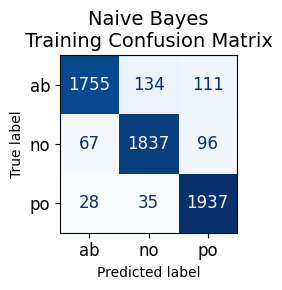

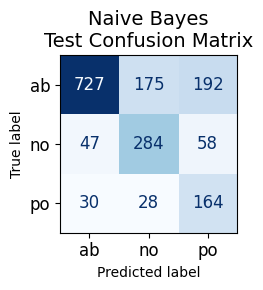

In [10]:
ml_models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Naive Bayes": MultinomialNB()
}

ml_results = {}
for name, model in ml_models.items():
    model.fit(X_train_tfidf, y_train_tfidf)
    y_pred_train = model.predict(X_train_tfidf)
    y_pred_test = model.predict(X_test_tfidf)
    ml_results[name] = model
    print(f"\n{name} Training Classification Report:")
    print(classification_report(y_train_tfidf, y_pred_train, target_names=le.classes_))
    
    # Confusion matrix
    cm_train = confusion_matrix(y_train_tfidf, y_pred_train)
    cm_test  = confusion_matrix(y_test_tfidf, y_pred_test)
    print(f"\n{name} Test Classification Report:")
    print(classification_report(y_test_tfidf, y_pred_test, target_names=le.classes_))

    # Plot confusion matrix
    # Small figure size
    fig, ax = plt.subplots(figsize=(3, 3))  # width x height in inches
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=le.classes_)
    disp.plot(cmap=plt.cm.Blues, ax=ax, colorbar=False)  # remove colorbar for compactness
    
    # Increase font size for readability
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for text in ax.texts:
        text.set_fontsize(12)
    
    plt.title(f"{name}\nTraining Confusion Matrix", fontsize=14)
    plt.tight_layout()
    plt.show()

    
    fig, ax = plt.subplots(figsize=(3, 3))  # width x height in inches
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=le.classes_)
    disp.plot(cmap=plt.cm.Blues, ax=ax, colorbar=False)  # remove colorbar for compactness
    
    # Increase font size for readability
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for text in ax.texts:
        text.set_fontsize(12)
    
    plt.title(f"{name}\nTest Confusion Matrix", fontsize=14)
    plt.tight_layout()
    plt.show()


In [12]:
import joblib
import pickle
modelpath = os.path.join(os.getcwd(),'model')
if not os.path.exists(modelpath):
    os.makedirs(modelpath)
# Save ML models
for name, model in ml_results.items():
    # Using joblib (recommended for scikit-learn models)
    joblib.dump(model, os.path.join(modelpath,f'{name.replace(" ", "_").lower()}_model.joblib'))
    

# Save the vectorizer and label encoder
joblib.dump(vectorizer_tfidf, os.path.join(modelpath,'tfidf_vectorizer.joblib'))
joblib.dump(le, os.path.join(modelpath,'label_encoder.joblib'))

print("ML models and preprocessing objects saved successfully!")

ML models and preprocessing objects saved successfully!


In [15]:
# Prepare data for DL
VOCAB_SIZE = 10000
MAX_LEN = 100
EMBEDDING_DIM = 128
tokenizer = Tokenizer(num_words=VOCAB_SIZE, oov_token="<OOV>")

tokenizer.fit_on_texts(train_df['cleaned_text'])
X_train_seq = tokenizer.texts_to_sequences(train_df['cleaned_text'])
X_train_pad = pad_sequences(X_train_seq, maxlen=MAX_LEN, padding='post')

X_test_seq = tokenizer.texts_to_sequences(test_df['cleaned_text'])
X_test_pad = pad_sequences(X_test_seq, maxlen=MAX_LEN, padding='post')

y_train_dl = train_df['label_encoded']
y_test_dl = test_df['label_encoded']

print(X_train_seq)
print(len(X_train_seq))
print(X_train_pad)

[[358, 5, 3680, 3681, 519], [425, 192, 616, 27, 957, 27, 447, 37, 425, 448, 448, 1687, 37, 520, 426, 37, 1688, 1689, 231, 686], [3682, 2712, 2088, 7, 36, 109], [394, 687, 44, 1181, 617, 4, 1690, 162, 617, 958, 394, 802, 394, 4, 688, 312, 959, 299], [3683], [215, 648, 2713], [163, 549], [395, 3684, 3685, 231], [3, 871, 803, 46, 3686], [36, 549, 3687], [74, 87, 804, 134, 30, 49, 345, 124, 2089, 87, 40, 427, 87], [1372, 92, 1373, 1058, 15, 960, 118, 477, 580], [170, 1374, 872, 40, 251, 60, 82, 21, 28, 71, 68, 21, 40, 2090, 105, 66, 359, 21, 279, 21, 28, 40, 872, 43], [3688, 18, 478, 3689, 87, 18, 3690, 13, 127], [47, 252, 17, 19, 79, 2714], [49, 285, 69, 253, 2091, 10], [805, 873, 805, 1691, 75, 1059, 50, 6], [16, 1182, 306, 745], [236, 396, 2092, 333, 581], [2715, 28, 28, 40, 28, 51, 2093], [1060, 1375, 10, 136, 3691, 181], [3, 1376, 3692, 2094, 45, 3693, 22, 1377, 2716, 51, 24, 3694, 186, 2095, 193, 171, 961, 118, 3695, 346, 216, 300], [1378, 806, 689, 649, 360, 286, 428, 301, 286, 428,

In [18]:

# 6. Build and train DL model
dl_model = Sequential([
    Embedding(VOCAB_SIZE, EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(64, return_sequences=True)),
    Bidirectional(LSTM(32)),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(len(le.classes_), activation='softmax')
])
dl_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
early_stop = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)


c:\Users\Peter_PPT\anaconda3\envs\nlp_myanmar\lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning:

Argument `input_length` is deprecated. Just remove it.



In [25]:
dl_history = dl_model.fit(
    X_train_pad, y_train_dl,
    validation_split=0.2,
    epochs=10, batch_size=32)#, callbacks=[early_stop])

model_name = 'DL'
# Save the model
dl_model.save(os.path.join(modelpath,f"DLmodel.h5"))

with open(os.path.join(modelpath,f'{model_name}_history.pkl'), 'wb') as file:
    pickle.dump(dl_history.history, file)

# Save tokenizer
with open(os.path.join(modelpath,f"{model_name}_tokenizer.pickle"), 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)
print(f"Tokenizer saved to saved_models/{model_name}_tokenizer.pickle")
    
    

Epoch 1/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.9994 - loss: 0.0044 - val_accuracy: 0.8867 - val_loss: 0.7864
Epoch 2/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9967 - loss: 0.0146 - val_accuracy: 0.8700 - val_loss: 0.7457
Epoch 3/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.9935 - loss: 0.0242 - val_accuracy: 0.8775 - val_loss: 0.7884
Epoch 4/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 16s 104ms/step - accuracy: 0.9965 - loss: 0.0143 - val_accuracy: 0.8733 - val_loss: 0.7155
Epoch 5/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 30s 197ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.8883 - val_loss: 0.6642
Epoch 6/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 33s 218ms/step - accuracy: 0.9977 - loss: 0.0153 - val_accuracy: 0.8767 - val_loss: 0.7043
Epoch 7/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 29s 192ms/step - accuracy: 0.9996 - loss: 0.0041 - val_accuracy: 0.8792 - val_loss: 0.7426
Epoch 8/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 31s 207ms/step - accuracy: 0.9990 - loss: 0.00

WARNING	absl:saving_api.py:save_model()- You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`. 


Tokenizer saved to saved_models/DL_tokenizer.pickle


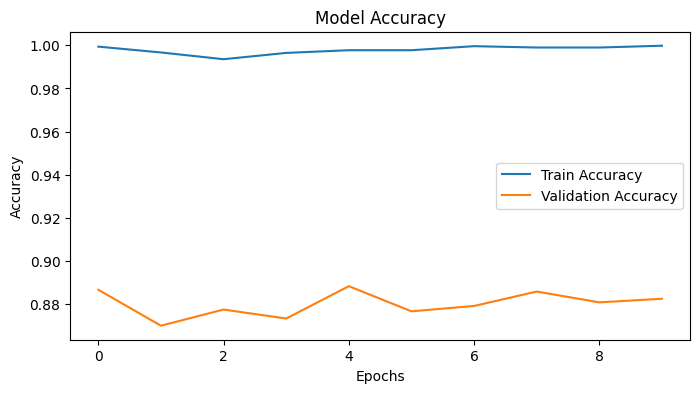

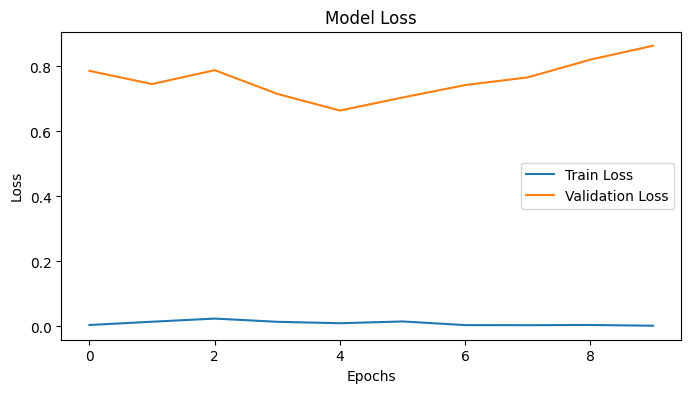

In [26]:

# Extract history
history = dl_history.history

# Plot Accuracy
plt.figure(figsize=(8, 4))
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')
plt.show()

# Plot Loss
plt.figure(figsize=(8, 4))
plt.plot(history['loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Model Loss')
plt.show()

188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

Deep Learning (Bi-LSTM) Training Classification Report:
              precision    recall  f1-score   support

          ab       0.98      0.96      0.97      2000
          no       0.97      0.98      0.98      2000
          po       0.98      0.99      0.98      2000

    accuracy                           0.98      6000
   macro avg       0.98      0.98      0.98      6000
weighted avg       0.98      0.98      0.98      6000

54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

Deep Learning (Bi-LSTM) Test Classification Report:
              precision    recall  f1-score   support

          ab       0.85      0.70      0.77      1094
          no       0.52      0.73      0.60       389
          po       0.52      0.60      0.56       222

    accuracy                           0.69      1705
   macro avg       0.63      0.68      0.64      1705
weighted avg       0.73      0.69      0.70      1705



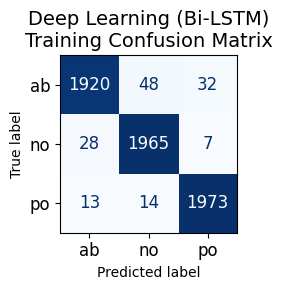

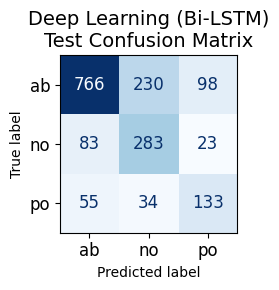

In [27]:
# Evaluate DL model
y_pred_dl_train = np.argmax(dl_model.predict(X_train_pad), axis=1)
print("\nDeep Learning (Bi-LSTM) Training Classification Report:")
print(classification_report(y_train_dl, y_pred_dl_train, target_names=le.classes_))

y_pred_dl = np.argmax(dl_model.predict(X_test_pad), axis=1)
print("\nDeep Learning (Bi-LSTM) Test Classification Report:")
print(classification_report(y_test_dl, y_pred_dl, target_names=le.classes_))

# Plot confusion matrix

# Small figure size for training
fig, ax = plt.subplots(figsize=(3, 3))  # width x height in inches
cm_train = confusion_matrix(y_train_dl, y_pred_dl_train)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=le.classes_)
disp.plot(cmap=plt.cm.Blues, ax=ax, colorbar=False)  # remove colorbar for compactness
# Increase font size for readability
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
for text in ax.texts:
    text.set_fontsize(12)
plt.title(f"Deep Learning (Bi-LSTM)\nTraining Confusion Matrix", fontsize=14)
plt.tight_layout()
plt.show()

# Small figure size for test
fig, ax = plt.subplots(figsize=(3, 3))  # width x height in inches
cm_test = confusion_matrix(y_test_dl, y_pred_dl)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=le.classes_)
disp.plot(cmap=plt.cm.Blues, ax=ax, colorbar=False)  # remove colorbar for compactness
# Increase font size for readability
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
for text in ax.texts:
    text.set_fontsize(12)
plt.title(f"Deep Learning (Bi-LSTM)\nTest Confusion Matrix", fontsize=14)
plt.tight_layout()
plt.show()


In [28]:

def predict_all_models(sentence,stop_words=None):
    cleaned = preprocess_text(sentence,stop_words)
    # print(f"\nInput: {sentence}\nCleaned: {cleaned}")
    
    
    results = []
    
    # --- ML predictions with probabilities
    vec = vectorizer_tfidf.transform([cleaned])
    for name, model in ml_results.items():
        # predicted class
        pred_class = le.inverse_transform(model.predict(vec))[0]
        # predicted probabilities (if model supports predict_proba)
        if hasattr(model, "predict_proba"):
            pred_probs = model.predict_proba(vec)[0]
            # map probabilities to class labels
            prob_dict = dict(zip(le.inverse_transform(np.arange(len(pred_probs))), pred_probs))
        else:
            prob_dict = None
        results.append({
            'model': name,
            'prediction': pred_class,
            'probabilities': prob_dict
        })
    
    # --- DL prediction with probabilities
    seq = tokenizer.texts_to_sequences([cleaned])
    pad = pad_sequences(seq, maxlen=MAX_LEN, padding='post')
    dl_probs = dl_model.predict(pad)[0]
    dl_pred_class = le.inverse_transform([np.argmax(dl_probs)])[0]
    dl_prob_dict = dict(zip(le.inverse_transform(np.arange(len(dl_probs))), dl_probs))
    
    results.append({
        'model': 'Deep Learning',
        'prediction': dl_pred_class,
        'probabilities': dl_prob_dict
    })
    
    # Convert to DataFrame
    resultdf = pd.DataFrame(results)
    resultdf['input'] = sentence
    resultdf = resultdf[['input', 'model', 'prediction', 'probabilities']]
    
    return resultdf

In [29]:
textlists=['ဒီစာကြောင်းကို စမ်းသပ်ကြည့်ပါ။',
           'နေကောင်းလား',
           'ယုတ်မာ လိုက် တာ သူ့ စိတ် ထဲ တဏှာ ပဲ ရှိ တယ် အဲ့လို လူမျိုး ဘယ် မိန်းကလေး မှ မ ဆုံ ပါ စေ နဲ့',
           'စောက်ရူးထ မ နေ နဲ့ ပြည်သူ တွေ ဘယ် ဘဝ ရောက် နေ တာ ကို လူ ဆို လူ လို သိ'
]
# Example usage:
alldf = pd.DataFrame()
for texts in textlists:
    resultdf = predict_all_models(texts)
    alldf = pd.concat([alldf,resultdf],ignore_index=True)
print("\nPredictions from all models:")
display(alldf)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

Predictions from all models:


,input,model,prediction,probabilities
0,ဒီစာကြောင်းကို စမ်းသပ်ကြည့်ပါ။,Logistic Regression,ab,"{'ab': 0.47429802591227044, 'no': 0.3491549980..."
1,ဒီစာကြောင်းကို စမ်းသပ်ကြည့်ပါ။,Naive Bayes,ab,"{'ab': 0.3333333333333333, 'no': 0.33333333333..."
2,ဒီစာကြောင်းကို စမ်းသပ်ကြည့်ပါ။,Deep Learning,no,"{'ab': 0.45776802, 'no': 0.5417344, 'po': 0.00..."
3,နေကောင်းလား,Logistic Regression,ab,"{'ab': 0.47429802591227044, 'no': 0.3491549980..."
4,နေကောင်းလား,Naive Bayes,ab,"{'ab': 0.3333333333333333, 'no': 0.33333333333..."
5,နေကောင်းလား,Deep Learning,no,"{'ab': 0.024770329, 'no': 0.97514534, 'po': 8...."
6,ယုတ်မာ လိုက် တာ သူ့ စိတ် ထဲ တဏှာ ပဲ ရှိ တယ် အဲ...,Logistic Regression,no,"{'ab': 0.18025479159332963, 'no': 0.7433769027..."
7,ယုတ်မာ လိုက် တာ သူ့ စိတ် ထဲ တဏှာ ပဲ ရှိ တယ် အဲ...,Naive Bayes,no,"{'ab': 0.1387772173073841, 'no': 0.73132317396..."
8,ယုတ်မာ လိုက် တာ သူ့ စိတ် ထဲ တဏှာ ပဲ ရှိ တယ် အဲ...,Deep Learning,ab,"{'ab': 0.99998164, 'no': 1.1944147e-05, 'po': ..."
9,စောက်ရူးထ မ နေ နဲ့ ပြည်သူ တွေ ဘယ် ဘဝ ရောက် နေ ...,Logistic Regression,po,"{'ab': 0.012764548253570988, 'no': 0.168926319..."


In [30]:
# Check class distribution
print("Train class distribution:")
print(train_df['label'].value_counts())
print("\nTest class distribution:")
print(test_df['label'].value_counts())

# Check text length statistics
train_df['text_length'] = train_df['text'].str.len()
test_df['text_length'] = test_df['text'].str.len()

print("\nText length statistics:")
print(f"Train - Mean: {train_df['text_length'].mean()}, Max: {train_df['text_length'].max()}")
print(f"Test - Mean: {test_df['text_length'].mean()}, Max: {test_df['text_length'].max()}")

# Check sample texts from each class
for label in train_df['label'].unique():
    print(f"\n--- {label} samples ---")
    samples = train_df[train_df['label'] == label]['text'].head(3).tolist()
    for i, sample in enumerate(samples):
        print(f"{i+1}. {sample}")

Train class distribution:
label
ab    2000
po    2000
no    2000
Name: count, dtype: int64

Test class distribution:
label
ab    1094
no     389
po     222
Name: count, dtype: int64

Text length statistics:
Train - Mean: 91.24583333333334, Max: 899
Test - Mean: 81.27624633431085, Max: 585

--- ab samples ---
1. ဖာ အားပေး မ လား မင်း က ပြော လက်စ ညီမပေး 😔
2. ဖက်တီး က ဘို လို မ မှုတ် နဲ့ လေ ငါ လီး က တည်း မှ ပဲ
3. ဖင်ခံ လို့ မ ဝ သေး လို့ ဘောပါမ ချင် တာ လား

--- po samples ---
1. ဆရာဝန် မှတ် က မှီ မှာ ပါ ဒါ ကျက် ဒါ ဖြေ ကြီး ပဲ လေ ၊ ဆရာဝန် ကောင်း ဖြစ် ဖို့ က တော့ လုံးဝ ( လုံးဝ ) မ ဖြစ် နိုင် ပါ ဘူး ဒီမင်းဒီစိုးဒီသူခိုး နဲ့ ၊ ဒီ မိုး ဒီ မြေ ဒီ လူ တွေ နဲ့ ၊ ဒီ မျိုးစေ့ က ဒီ အပင် ပဲ ပေါက် မှာ ပါ ။ 👍
2. တရုတ် ဖျင်ခံ နေ တဲ့ စစ်ခွေး တွေ ပဲ ဒီမို စစ်စစ် မ ရ ချင် ကြ တာ ပါ မြန်မာ သာ ဖယ်ထရယ် ဒီမိုကရေစီ စစ်စစ် ကျင့်သုံး ရင် တရုတ် မှာ လည်း လှုပ် လာ မှာ ပဲ တရုတ် လည်း မြန်မာ လို ပြည်နယ် များ စွာ ကို ချုပ်ကိုင် ပြီး အုပ်ချုပ် နေ တာ
3. ကွန်ပျုတာ ဆိုင် သွား ပြီး စာစီ ထား တဲ့ စာရွက် လောက် ကို ဗူး နဲ့ ထည့် ပြီး

# not use

In [ ]:
def debug_prediction(sentence, true_label=None):
    """
    Detailed debugging for a specific sentence prediction
    """
    cleaned = preprocess_text(sentence)
    print(f"Input: {sentence}")
    print(f"Cleaned: {cleaned}")
    print(f"True label: {true_label}" if true_label else "")
    
    # --- ML Model Analysis ---
    vec = vectorizer_tfidf.transform([cleaned])
    feature_names = vectorizer_tfidf.get_feature_names_out()
    
    print("\n" + "="*50)
    print("ML MODEL FEATURE ANALYSIS")
    print("="*50)
    
    # Check if the sentence has any features at all
    if vec.sum() == 0:
        print("⚠️  WARNING: No features found in the cleaned sentence!")
        print("This means preprocessing removed all words or words are not in vocabulary")
        print("Try checking your preprocessing steps or vocabulary coverage")
    else:
        print(f"Number of features found: {vec.sum()}")
    
    # Get feature importance for each ML model
    for name, model in ml_results.items():
        print(f"\n{name} Model Analysis:")
        
        if hasattr(model, 'coef_'):
            # For linear models
            coef = model.coef_[0] if len(model.coef_.shape) > 1 else model.coef_
            
            # Get top contributing features for this specific sentence
            sentence_features = vec.toarray()[0]
            contributing_features = []
            
            for i, val in enumerate(sentence_features):
                if val > 0:
                    contributing_features.append({
                        'feature': feature_names[i],
                        'value': val,
                        'weight': coef[i],
                        'contribution': val * coef[i]
                    })
            
            if contributing_features:
                contributing_df = pd.DataFrame(contributing_features)
                contributing_df = contributing_df.sort_values('contribution', ascending=False)
                
                print("Top Contributing Features:")
                print(contributing_df.head(10))
                
                # Show overall sentiment
                total_contribution = contributing_df['contribution'].sum()
                print(f"Total contribution: {total_contribution:.4f}")
                print(f"Suggested class: {'HATE' if total_contribution > 0 else 'NON-HATE'}")
            else:
                print("No features with positive values found in this sentence")
        
        elif hasattr(model, 'feature_importances_'):
            # For tree-based models
            print("Feature importance analysis available for tree-based models")
            
        else:
            print("Model type doesn't support coefficient-based analysis")
    
    # --- DL Model Analysis ---
    print("\n" + "="*50)
    print("DEEP LEARNING MODEL ANALYSIS")
    print("="*50)
    
    try:
        seq = tokenizer.texts_to_sequences([cleaned])
        pad = pad_sequences(seq, maxlen=MAX_LEN, padding='post')
        
        print(f"Tokenized sequence: {seq[0]}")
        print(f"Padded sequence: {pad[0]}")
        
        # Get word-to-index mapping for analysis
        word_index = tokenizer.word_index
        index_word = {v: k for k, v in word_index.items()}
        
        sequence_words = [index_word.get(i, 'UNK') for i in seq[0] if i != 0]
        print(f"Sequence words: {sequence_words}")
        
        if not sequence_words:
            print("⚠️  WARNING: No words recognized by DL model vocabulary!")
        
    except Exception as e:
        print(f"Error in DL analysis: {e}")
    
    # --- All Model Predictions ---
    try:
        results = predict_all_models(sentence)
        print("\n" + "="*50)
        print("ALL MODEL PREDICTIONS")
        print("="*50)
        print(results)
    except Exception as e:
        print(f"Error in getting predictions: {e}")
    
    return True

# Additional diagnostic functions
def check_vocabulary_coverage(sentence):
    """
    Check which words are in the vocabulary
    """
    cleaned = preprocess_text(sentence)
    words = cleaned.split()
    
    print(f"Sentence: {sentence}")
    print(f"Cleaned words: {words}")
    
    # Check ML vocabulary
    ml_vocab = set(vectorizer_tfidf.get_feature_names_out())
    ml_matches = [word for word in words if word in ml_vocab]
    print(f"ML vocabulary matches: {ml_matches} ({len(ml_matches)}/{len(words)})")
    
    # Check DL vocabulary
    if hasattr(tokenizer, 'word_index'):
        dl_vocab = set(tokenizer.word_index.keys())
        dl_matches = [word for word in words if word in dl_vocab]
        print(f"DL vocabulary matches: {dl_matches} ({len(dl_matches)}/{len(words)})")
    else:
        print("DL vocabulary not available")

def analyze_preprocessing(sentence):
    """
    Step-by-step preprocessing analysis
    """
    print(f"Original: {sentence}")
    
    # Step 2: Remove URLs, mentions, hashtags
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#(\w+)', r'\1', text)
    print(f"After removing URLs/mentions: {text}")
    
    # Step 3: Remove numbers and special characters
    text = re.sub(r'[^\w\s\u1000-\u109F\uAA60-\uAA7F]', ' ', text)
    text = re.sub(r'\d+', '', text)
    print(f"After removing special chars: {text}")
    
    # Step 4: Remove extra whitespace and lowercase
    text = re.sub(r'\s+', ' ', text).strip().lower()
    print(f"Final cleaned: {text}")
    
    return text

# Use these functions to debug
debugtext = 'ဒီစာကြောင်းကို စမ်းသပ်ကြည့်ပါ'
truedebuglabel = 'no'

print("=== PREPROCESSING ANALYSIS ===")
cleaned = analyze_preprocessing(debugtext)

print("\n=== VOCABULARY COVERAGE ===")
check_vocabulary_coverage(debugtext)

print("\n=== PREDICTION DEBUG ===")
debug_prediction(debugtext, true_label=truedebuglabel)

=== PREPROCESSING ANALYSIS ===
Original: ဒီစာကြောင်းကို စမ်းသပ်ကြည့်ပါ


NameError: name 'unicodedata' is not defined